In [61]:
import numpy as np
import requests
import json
import networkx as nx
import time
import matplotlib.pyplot as plt
from pprint import pprint

In [2]:
my_token = open('./token.txt', 'r').read()[:-1]
my_id = 145170120

In [72]:
# Get friends IDs and self data based on the requested fields

fields = 'sex, country, city, universities'

get_friends_str = 'https://api.vk.com/method/friends.get?user_id={}&v=5.21&fields={}&access_token={}'
get_friends_nofields_str = 'https://api.vk.com/method/friends.get?user_id={}&v=5.21&access_token={}'
get_my_str = 'https://api.vk.com/method/users.get?user_id={}&v=5.21&fields={}&access_token={}'

data_friends = requests.get(get_friends_str.format(my_id, fields, my_token)).json()['response']['items']
data_my = requests.get(get_my_str.format(my_id, fields, my_token)).json()['response']
ids_friends = requests.get(get_friends_nofields_str.format(my_id, my_token)).json()['response']['items']

data_all = data_my + data_friends
ids_all = [my_id] + ids_friends

In [6]:
n_nodes_all = len(ids_all)
n_nodes_friends = n_nodes_all-1
mutual_matrix_all = np.zeros((n_nodes_all, n_nodes_all))
mutual_matrix_all[0] = np.full(n_nodes_all, 1)
mutual_matrix_all[:, 0] = np.full(n_nodes_all, 1)
get_mutual_str = 'https://api.vk.com/method/friends.getMutual?v=5.21?source_uid={}&target_uid={}&access_token={}'

for friend_id in ids_all[1:]:
    request_get = requests.get(get_mutual_str.format(my_id, friend_id, my_token)).json()
    if request_get.get('error'):
        time.sleep(3)
        request_get = requests.get(get_mutual_str.format(my_id, friend_id, my_token)).json()
    mutual_ids_all = request_get['response']
    for mutual_id in mutual_ids_all:
        friend_x = ids_all.index(friend_id)
        mutual_x = ids_all.index(mutual_id)
        mutual_matrix_all[friend_x, mutual_x] = 1
        mutual_matrix_all[mutual_x, friend_x] = 1

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


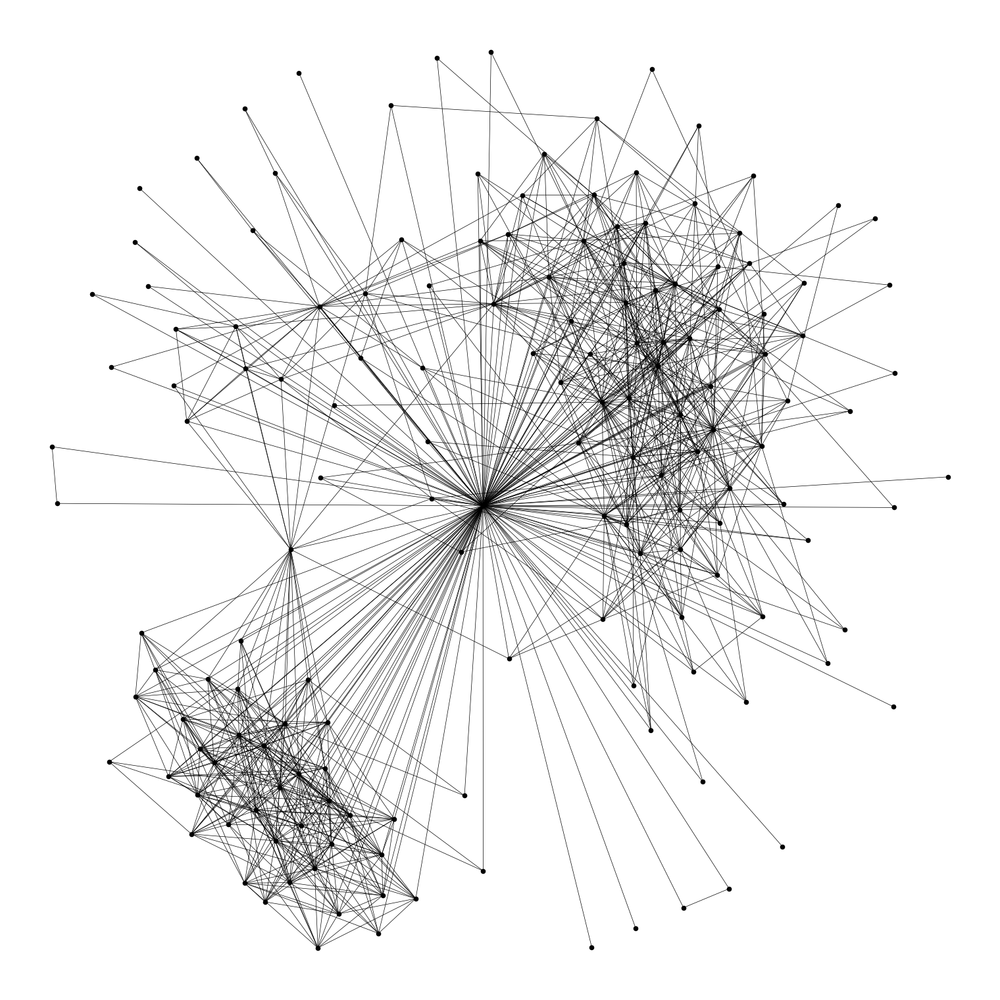

In [156]:
graph = nx.from_numpy_matrix(mutual_matrix_all)
plt.figure(figsize=(15, 15), dpi=100)
#pos = nx.nx_agraph.graphviz_layout(graph)
pos = nx.spring_layout(graph)
nx.draw(graph, pos, node_size=20, node_color=(0, 0, 0), width=0.5)

In [49]:
mutual_matrix_friends = mutual_matrix_all[1:, 1:]
delete_rowscols = []
for i in range(n_nodes_friends):
    if np.sum(mutual_matrix_friends[i]) <= 2:
        delete_rowscols.append(i)
mutual_matrix_friends_short = np.delete(mutual_matrix_friends, delete_rowscols, 0)
mutual_matrix_friends_short = np.delete(mutual_matrix_friends_short, delete_rowscols, 1)

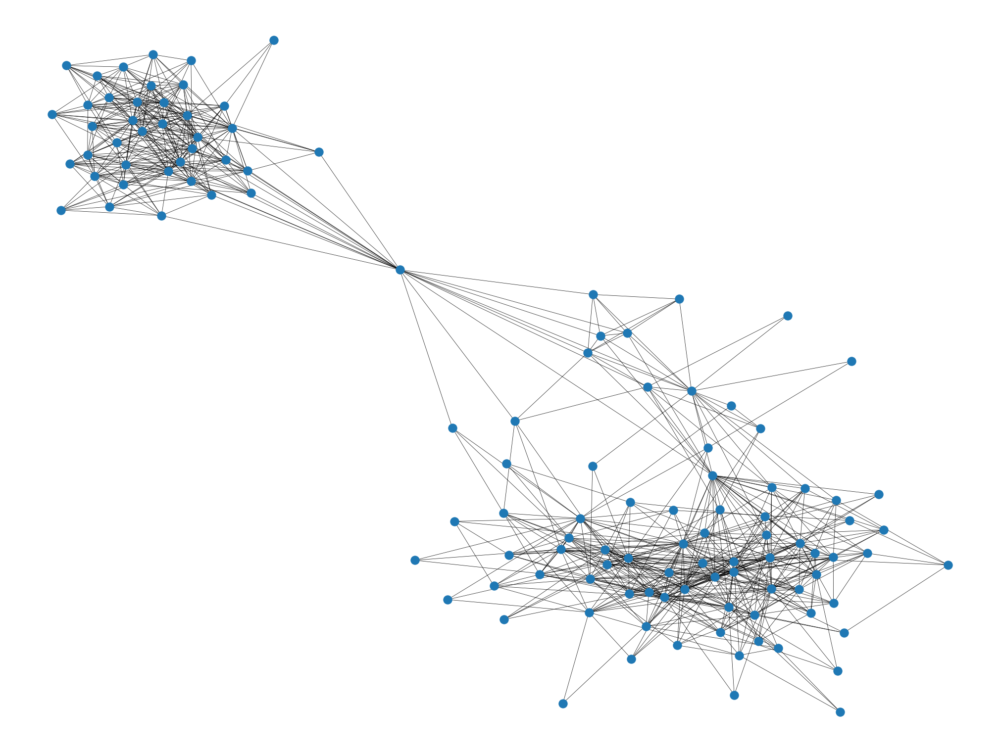

In [140]:
graph = nx.from_numpy_matrix(mutual_matrix_friends_short)
plt.figure(figsize=(20, 15), dpi=100)
pos = nx.spring_layout(graph)
nx.draw(graph, pos, node_size=150, width=0.5)

In [62]:
pprint(data_all[0])

{'city': {'id': 2, 'title': 'Санкт-Петербург'},
 'country': {'id': 1, 'title': 'Россия'},
 'first_name': 'Денис',
 'id': 145170120,
 'last_name': 'Ужва',
 'sex': 2,
 'universities': [{'city': 2,
                   'country': 1,
                   'faculty': 14,
                   'faculty_name': 'Физический факультет',
                   'id': 1,
                   'name': 'СПбГУ'},
                  {'city': 2,
                   'country': 1,
                   'faculty': 7,
                   'faculty_name': 'Математико-механический факультет',
                   'id': 1,
                   'name': 'СПбГУ'}]}


In [63]:
for agent in data_all:
    if agent['id'] == 313351498:
        pprint(agent)

{'first_name': 'Sybil',
 'id': 313351498,
 'last_name': 'Reisz',
 'sex': 1,
 'track_code': '88b5b2fdpTMaGqBcVwCDnAxBh45XMNV4YN9f3QAlvoMDXZiNumHIWBMtyloFCoiZQpBRKLNapmx500izZA',
 'universities': []}


In [100]:
# Counts for various categories

sex_titles = {1: 'female', 2: 'male'}
country_titles = {0: 'not specified'}
city_titles = {0: 'not specified'}
university_titles = {0: 'not specified'}

sex_count = {1: 0, 2: 0}
country_count = {0: 0}
city_count = {0: 0}
university_count = {0: 0}

for agent in data_friends:

    agent_sex = agent['sex']
    sex_count[agent_sex] += 1

    agent_country = 0
    if agent.get('country'):
        agent_country = agent['country']['id']
        country_titles[agent_country] = agent['country']['title']
    if not country_count.get(agent_country):
        country_count[agent_country] = 0
    country_count[agent_country] += 1

    agent_city = 0
    if agent.get('city'):
        agent_city = agent['city']['id']
        city_titles[agent_city] = agent['city']['title']
    if not city_count.get(agent_city):
        city_count[agent_city] = 0
    city_count[agent_city] += 1

    agent_unis = []
    if agent.get('universities'):
        for agent_uni_data in agent['universities']:
            agent_uni = agent_uni_data['id']
            agent_unis.append(agent_uni)
            university_titles[agent_uni] = agent_uni_data['name']
            if not university_count.get(agent_uni):
                university_count[agent_uni] = 0
            university_count[agent_uni] += 1
    if len(agent_unis) == 0:
        university_count[0] += 1

In [101]:
# Adjacency matrices for various categories

sex_matrix = np.zeros((n_nodes_friends, n_nodes_friends))
country_matrix = np.zeros_like(sex_matrix)
city_matrix = np.zeros_like(sex_matrix)
university_matrix = np.zeros_like(sex_matrix)

for i, a1 in enumerate(data_friends[:-1]):
    for j, a2 in enumerate(data_friends[i+1:]):
        
        j = j + i + 1
        
        a1_sex = a1['sex']
        a2_sex = a2['sex']
        if a1_sex == a2_sex:
            sex_matrix[i, j] = 1
            
        a1_country = 0
        a2_country = 0
        if a1.get('country'):
            a1_country = a1['country']['id']
        if a2.get('country'):
            a2_country = a2['country']['id']
        if a1_country == a2_country:
            country_matrix[i, j] = 1
        
        a1_city = 0
        a2_city = 0
        if a1.get('city'):
            a1_city = a1['city']['id']
        if a2.get('city'):
            a2_city = a2['city']['id']
        if a1_city == a2_city:
            city_matrix[i, j] = 1
        
        a1_unis = []
        a2_unis = []
        if a1.get('universities'):
            for a1_uni_data in a1['universities']:
                a1_uni = a1_uni_data['id']
                a1_unis.append(a1_uni)
        if a2.get('universities'):
            for a2_uni_data in a2['universities']:
                a2_uni = a2_uni_data['id']
                a2_unis.append(a2_uni)
        if (len(a1_unis) == 0) and (len(a2_unis) == 0):
            university_matrix[i, j] = 1
        for a1_uni in a1_unis:
            for a2_uni in a2_unis:
                if a1_uni == a2_uni:
                    university_matrix[i, j] = 1
                    
sex_matrix += sex_matrix.T
country_matrix += country_matrix.T
city_matrix += city_matrix.T
university_matrix += university_matrix.T

[]

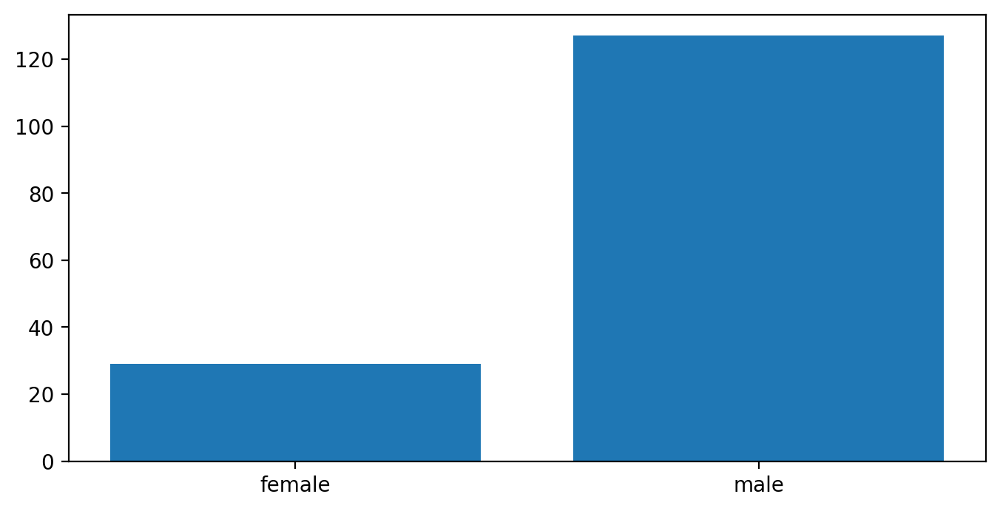

In [107]:
# Sex distribution

plt.figure(figsize=(8, 4), dpi=200)
plt.bar(sex_titles.values(), sex_count.values())
plt.plot()

[]

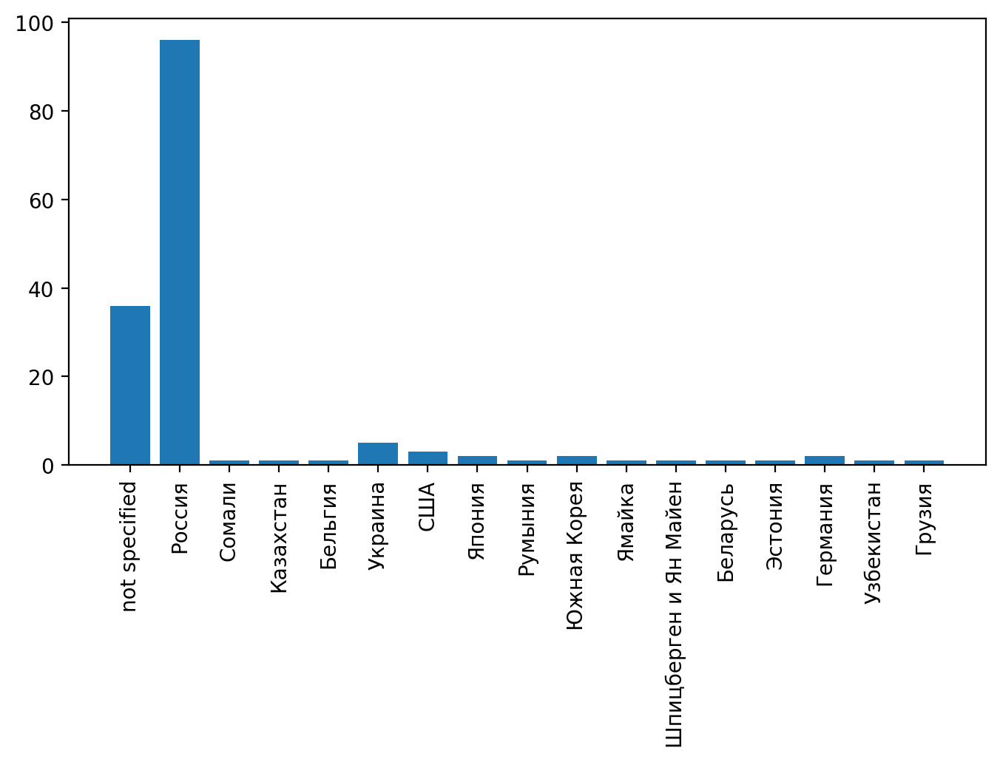

In [109]:
# Country distribution

plt.figure(figsize=(8, 4), dpi=200)
plt.bar(country_titles.values(), country_count.values())
plt.xticks(rotation=90)
plt.plot()

[]

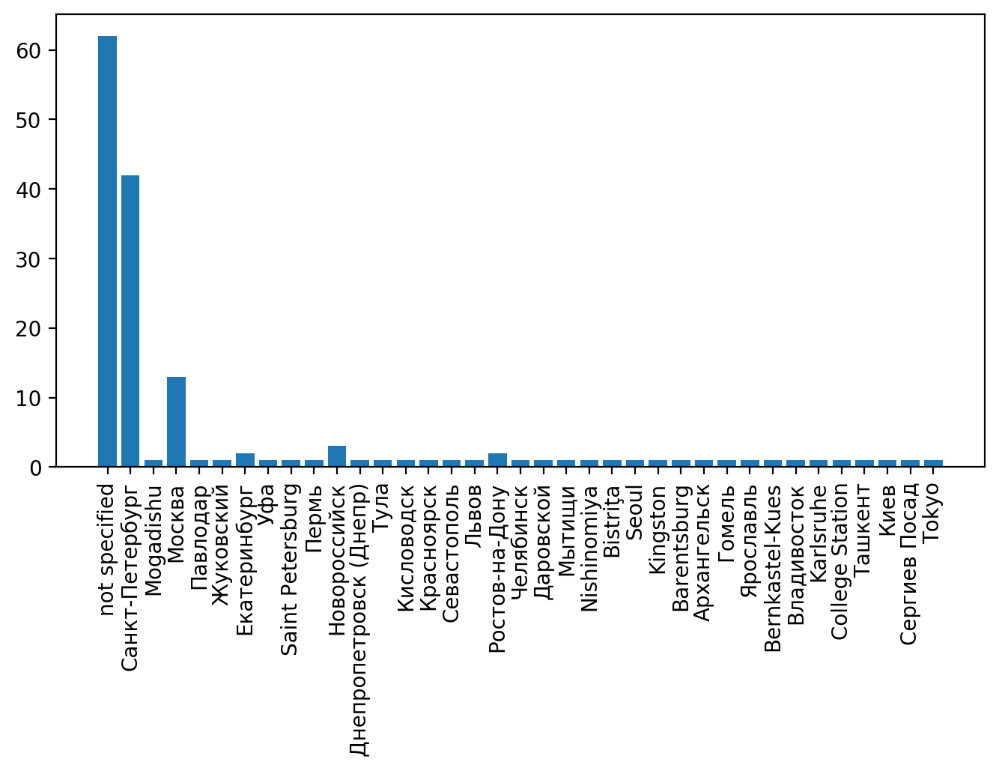

In [110]:
# City distribution

plt.figure(figsize=(8, 4), dpi=200)
plt.bar(city_titles.values(), city_count.values())
plt.xticks(rotation=90)
plt.plot()

[]

/home/mortarsynth/.local/lib/python3.6/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 21517 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/home/mortarsynth/.local/lib/python3.6/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 21476 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/home/mortarsynth/.local/lib/python3.6/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 23627 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/home/mortarsynth/.local/lib/python3.6/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 22806 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/home/mortarsynth/.local/lib/python3.6/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 22269 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/home/mortarsynth/.local/lib/python3.6/site-packages/matplotlib/backends/ba

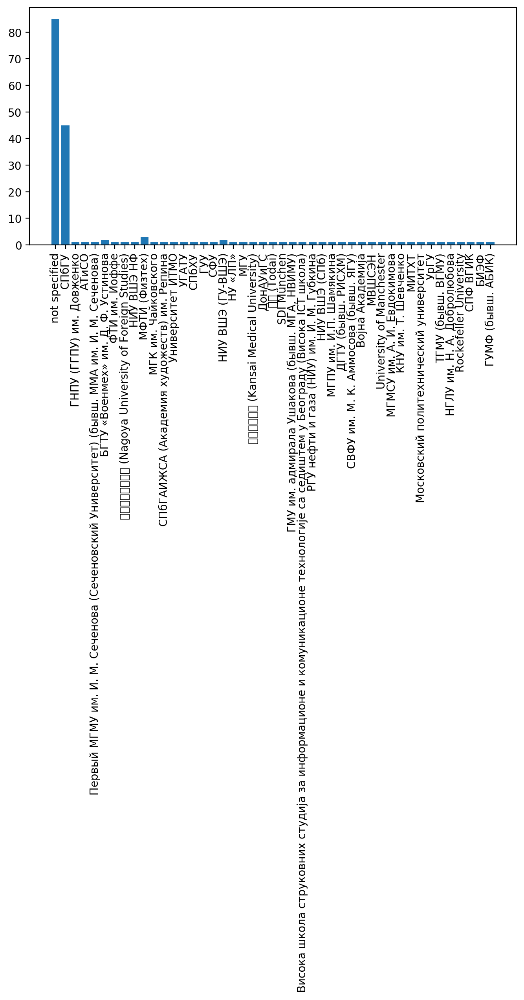

In [111]:
# University distribution

plt.figure(figsize=(8, 4), dpi=200)
plt.bar(university_titles.values(), university_count.values())
plt.xticks(rotation=90)
plt.plot()

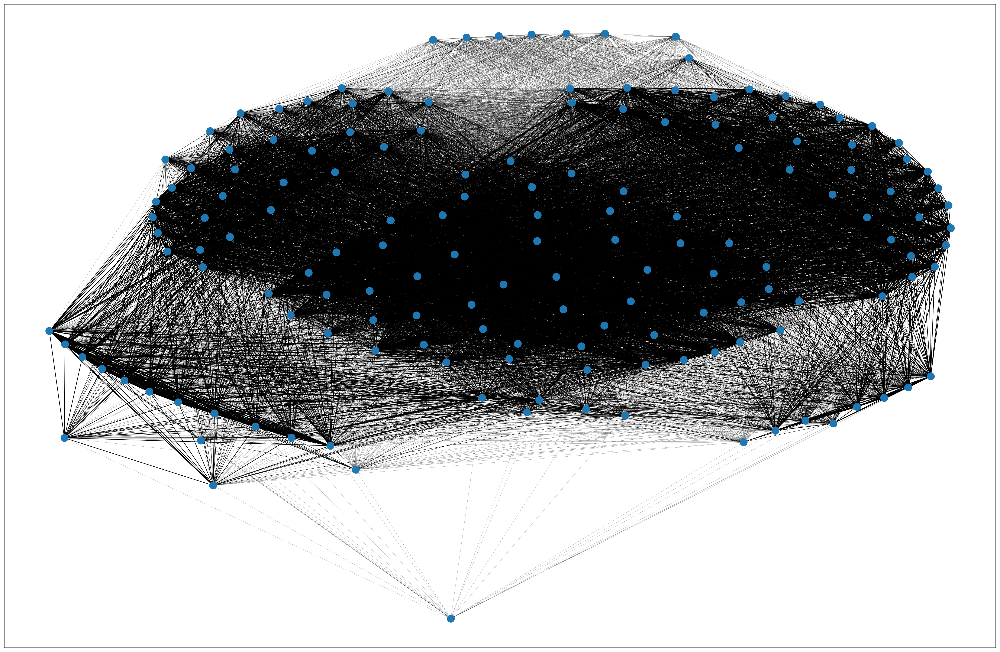

In [133]:
# Draw graph with the edge width depending on weights (no mutual friendship)

adj_matrix_nomut = sex_matrix + country_matrix + city_matrix + university_matrix
#adj_matrix_nomut = adj_matrix_nomut[:50, :50]
am_max = np.max(adj_matrix_nomut)
graph = nx.from_numpy_matrix(adj_matrix_nomut)
graph_edges = {}
for wgt in range(1, int(am_max)+1):
    graph_edges[wgt] = [(u,v) for (u,v,d) in graph.edges(data=True) if d['weight'] == wgt]

plt.figure(figsize=(30, 20), dpi=200)
pos = nx.nx_agraph.graphviz_layout(graph)

nx.draw_networkx_nodes(graph, pos, node_size=150)
for wgt in range(1, int(am_max)+1):
    nx.draw_networkx_edges(graph, pos, edgelist=graph_edges[wgt], width=wgt*wgt*0.1)

plt.show()